In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# import pywt

import numba
from numba import jit,njit
from numba.typed import List

from hampel import hampels
# from wifilib import get_scale_csi,read_bf_file
from wifilib_numba_v2 import get_scale_csi,read_bf_file

from scipy.ndimage import gaussian_filter

In [2]:
import matplotlib as ml
# font
ml.rcParams["font.sans-serif"]="Times New Roman"
ml.rcParams["font.size"]=16
ml.rcParams["axes.labelpad"]=0

In [3]:
def read_file(path):
    params,csis = read_bf_file(path)
    csi_complex=get_scale_csi(csis, params)
    csi_abs = np.abs(csi_complex)
    return csi_abs

In [4]:
@jit(nopython=True)
def fillna(csi):
    csi=csi.copy().T
    for i in np.arange(0,csi.shape[0]):
        for j in np.arange(0,csi.shape[1]):
            if np.isnan(csi[i,j]):
                if j>0:
                    csi[i,j]=csi[i,j-1]
                else:
                    csi[i,j]=0
    return csi.T

In [5]:
@jit(forceobj=True)
def get_cv(csi,n=20):
    csi_re=csi.reshape(csi.shape[0]//n,n,-1)
    csi_std=csi_re.std(1)
    csi_mean=csi_re.mean(1)
    csi_cv=np.divide(csi_std, csi_mean, out=np.zeros_like(csi_std), where=csi_mean!=0)
    return csi_cv

['dat\\a_05_00_05.dat', 'dat\\a_05_01_05.dat', 'dat\\a_05_02_05.dat', 'dat\\a_05_03_05.dat', 'dat\\a_05_04_05.dat', 'dat\\a_05_05_05.dat', 'dat\\a_05_06_05.dat', 'dat\\a_05_10_00.dat']
dat\a_05_00_05.dat


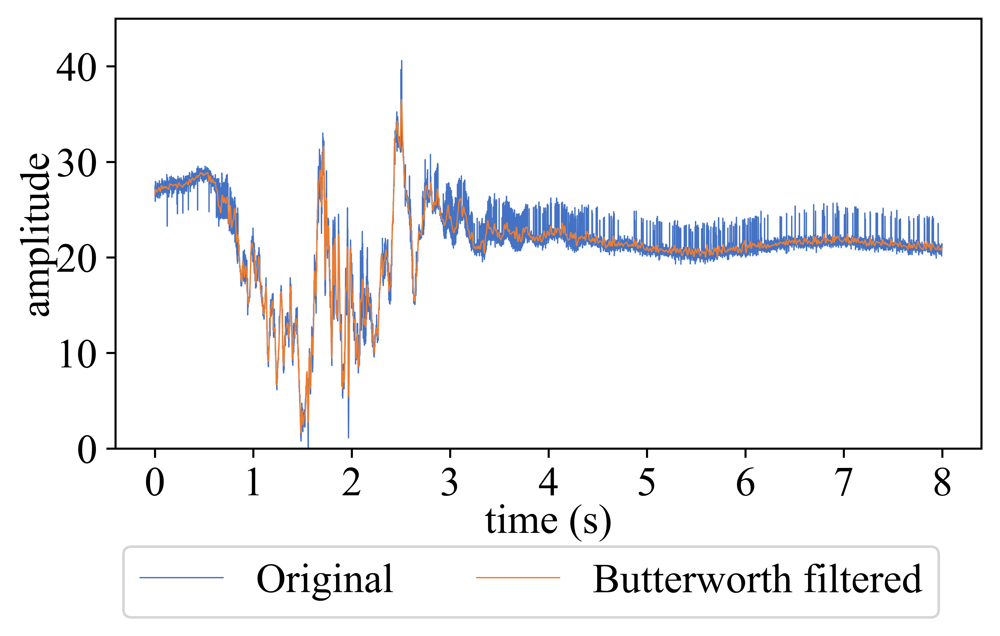

dat\a_05_01_05.dat


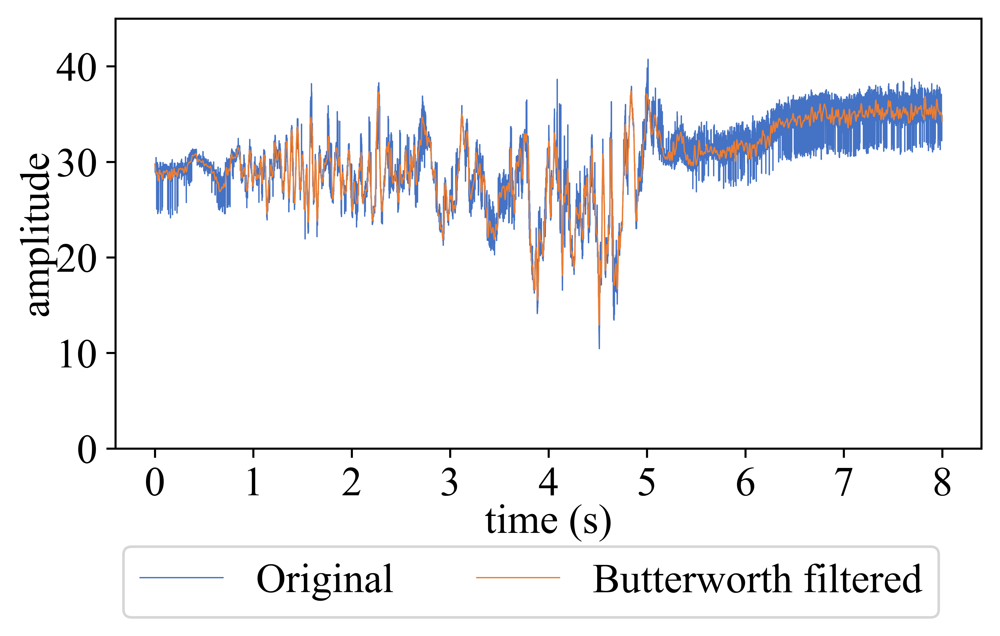

dat\a_05_02_05.dat


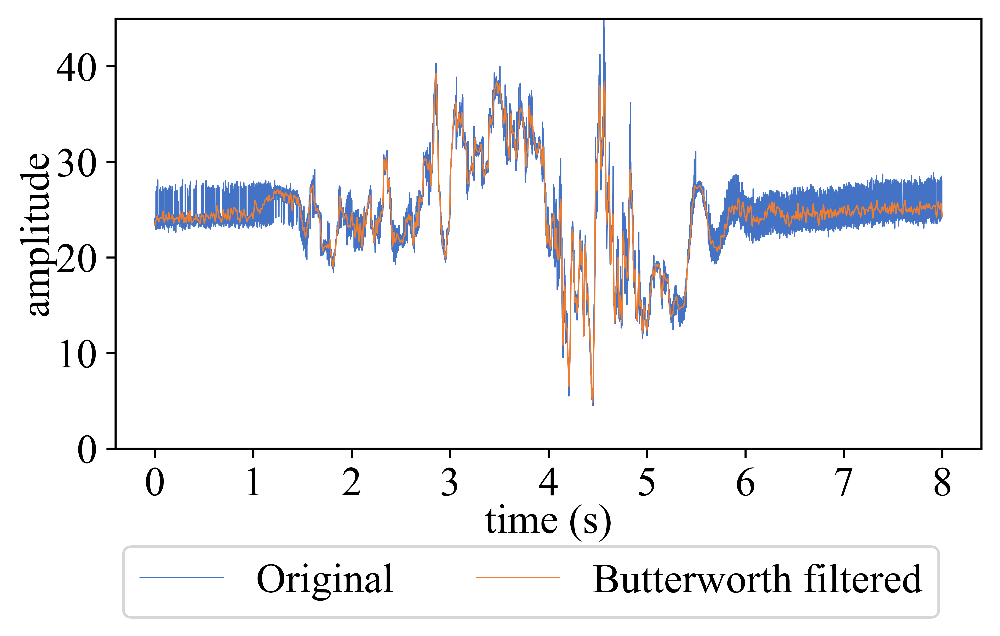

dat\a_05_03_05.dat


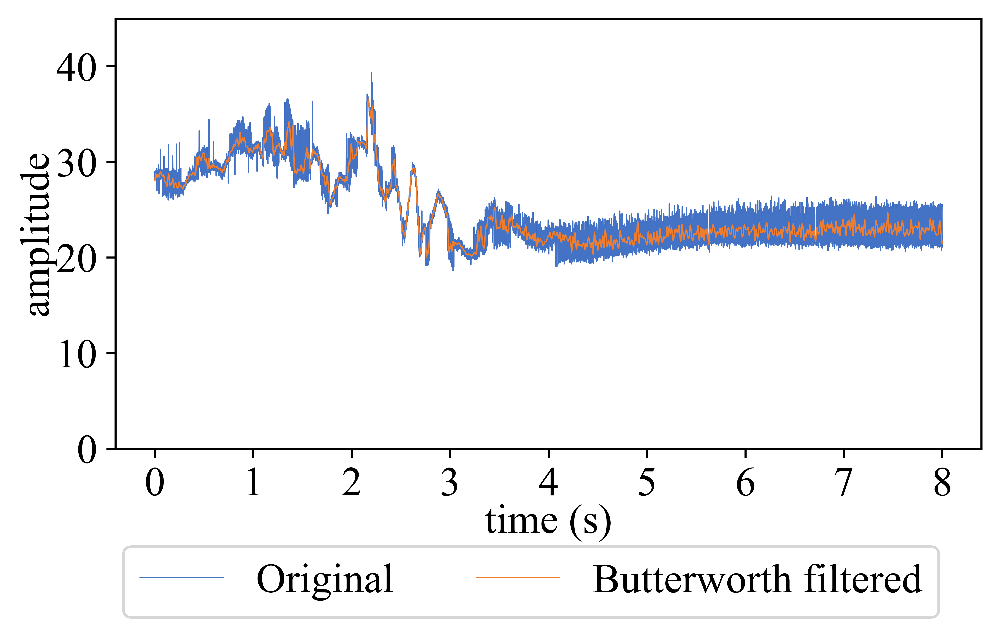

dat\a_05_04_05.dat


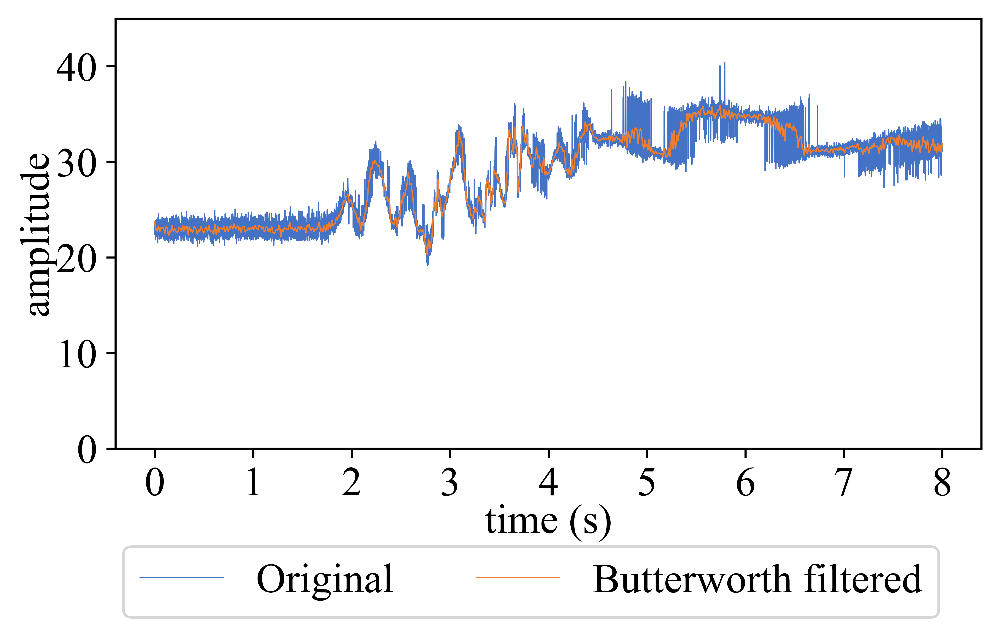

dat\a_05_05_05.dat


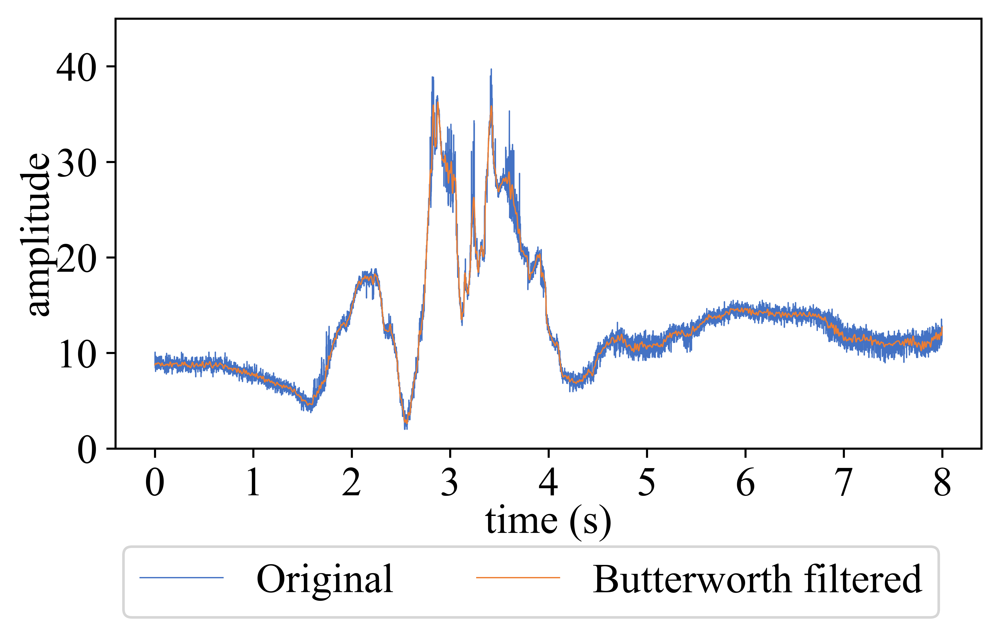

dat\a_05_06_05.dat


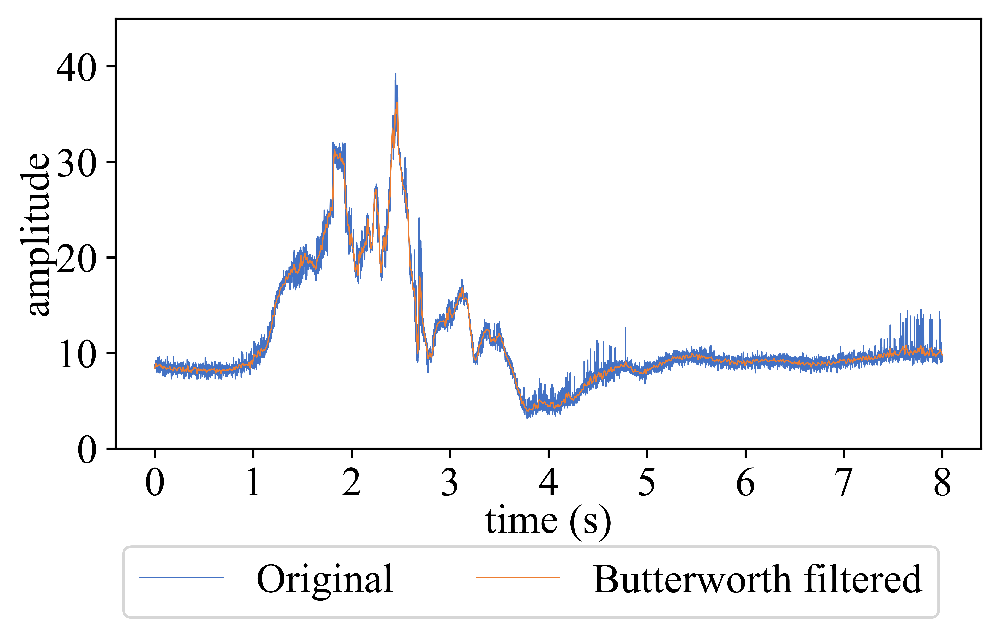

dat\a_05_10_00.dat


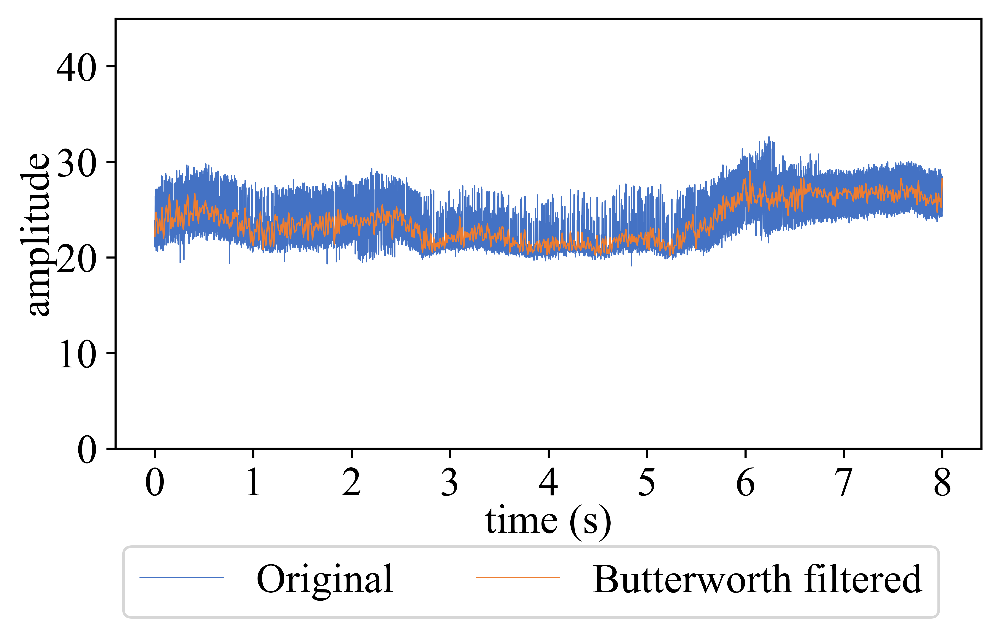

In [6]:
# Original and Butterworth filtered CSI amplitude
from scipy import signal
import glob

# path="dat/a_05_00_05.dat"
# path="dat/a_05_01_05.dat"
# path="dat/a_05_02_05.dat"
# path="dat/a_05_03_05.dat"
# path="dat/a_05_04_05.dat"
# path="dat/a_05_05_05.dat"
# path="dat/a_05_06_05.dat"
# path="dat/a_05_10_00.dat"

pathlist=sorted(glob.glob("dat/*"))
print(pathlist)

for path in pathlist:
    print(path)
    csi = read_file(path)
    csi=csi.reshape(csi.shape[0],-1)[:,:90][:8000]
    csi=fillna(csi)

    b, a = signal.butter(8, 0.1, 'lowpass')
    csi_butter = signal.filtfilt(b, a, csi,axis=0)
    x_butter_cv=get_cv(csi_butter,n=20)

    fig = plt.figure(dpi=1000, figsize=(6,3))
    plt.plot(csi[:,0],  linewidth=0.5,label="Original",color='#4472C4')
    plt.plot(csi_butter[:,0], linewidth=0.5,label="Butterworth filtered",color='#ED7D31')
    plt.xticks(np.arange(0,len(csi)+1,1000), np.arange(0,len(csi)//1000+1))
    plt.xlabel("time (s)")
    plt.ylabel("amplitude")
    plt.ylim(0,45)
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.48,-0.18),
        ncol=2,
    )
    plt.show()
    plt.close()

['dat\\a_05_00_05.dat', 'dat\\a_05_01_05.dat', 'dat\\a_05_02_05.dat', 'dat\\a_05_03_05.dat', 'dat\\a_05_04_05.dat', 'dat\\a_05_05_05.dat', 'dat\\a_05_06_05.dat', 'dat\\a_05_10_00.dat']
dat\a_05_00_05.dat


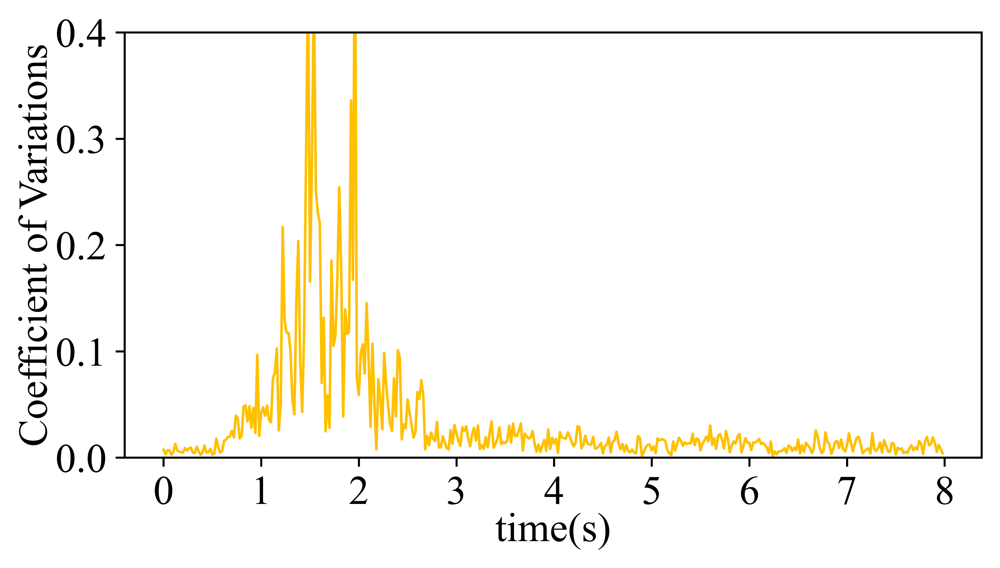

dat\a_05_01_05.dat


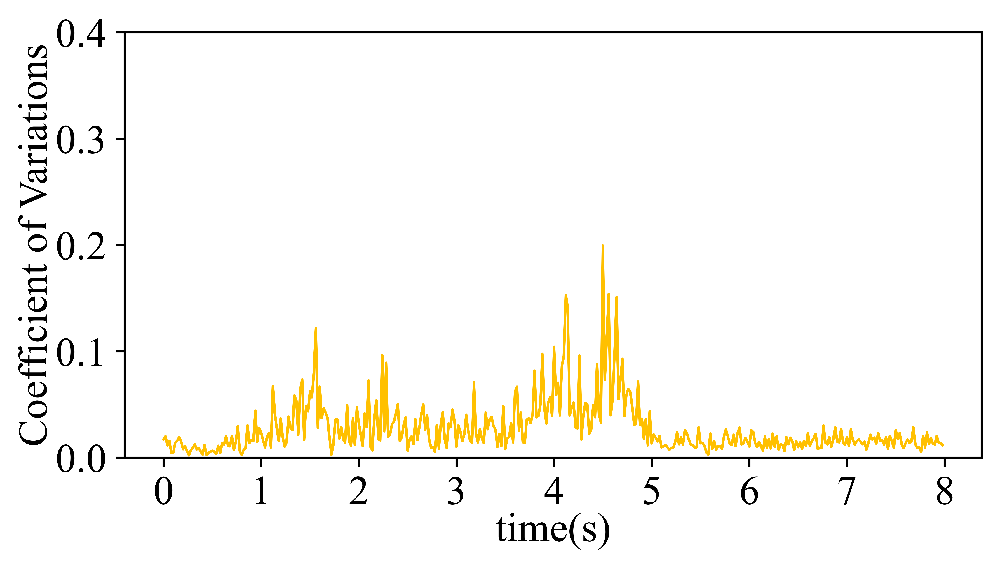

dat\a_05_02_05.dat


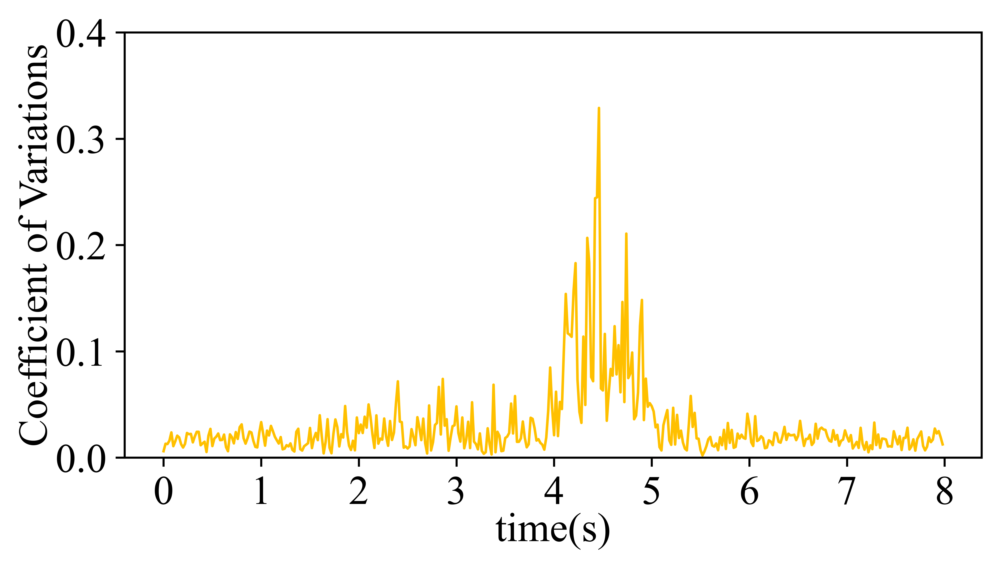

dat\a_05_03_05.dat


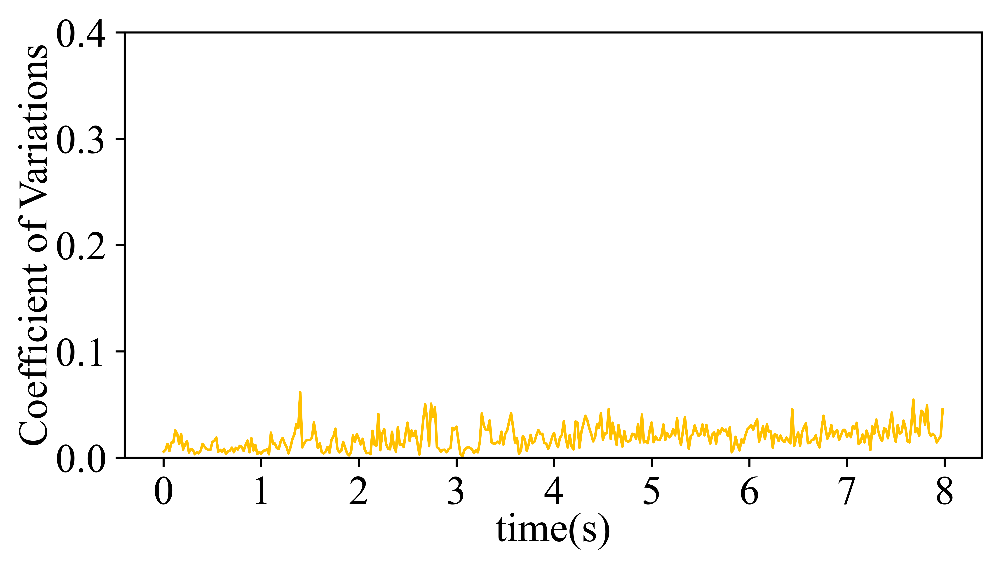

dat\a_05_04_05.dat


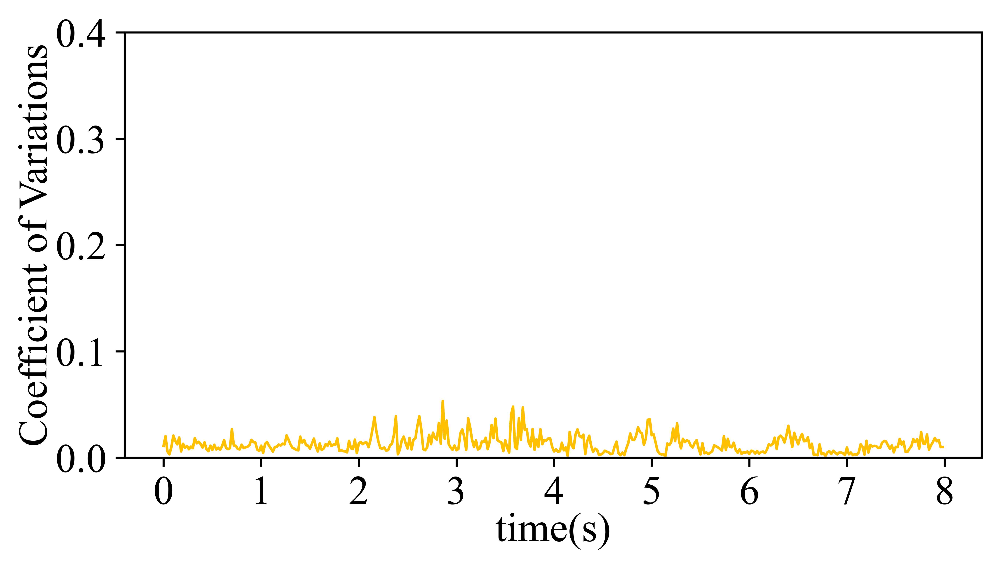

dat\a_05_05_05.dat


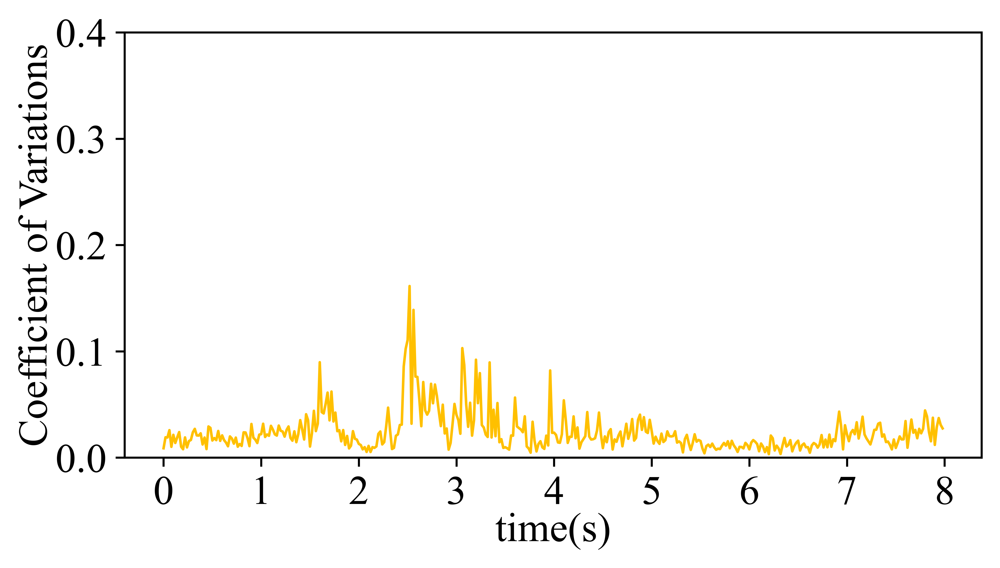

dat\a_05_06_05.dat


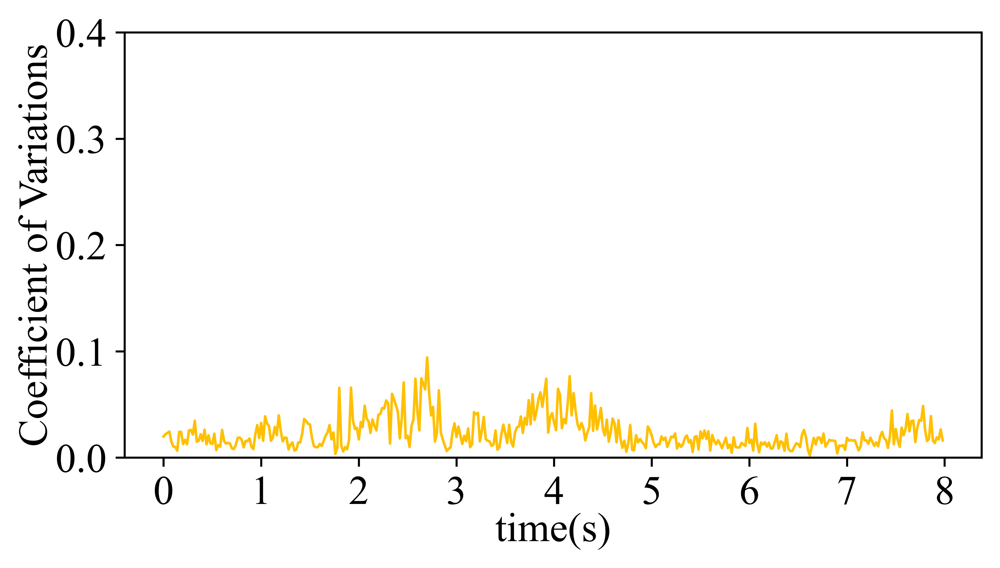

dat\a_05_10_00.dat


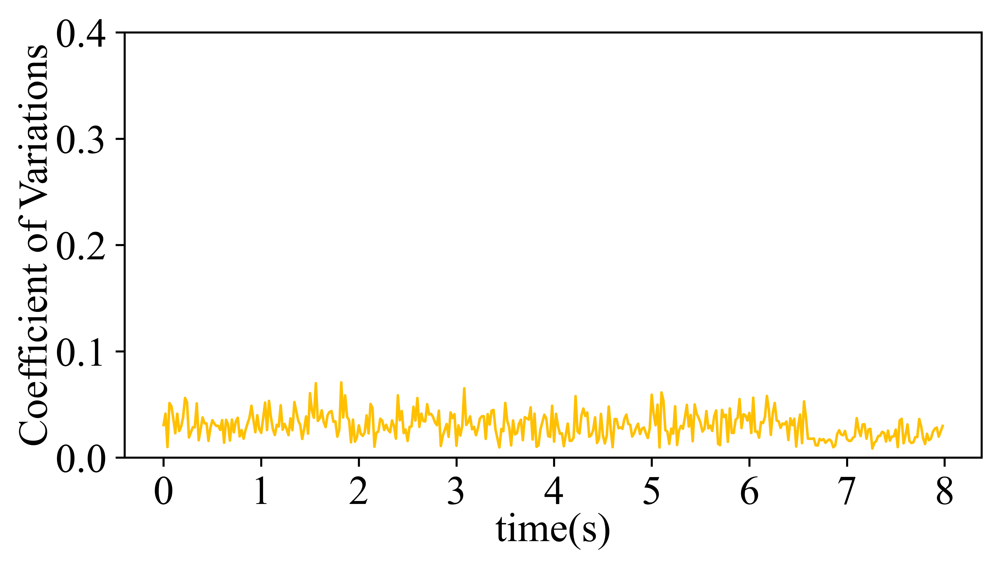

In [7]:
# CV of CSI amplitude
from scipy import signal

# path="dat/a_05_00_05.dat"
# path="dat/a_05_01_05.dat"
# path="dat/a_05_02_05.dat"
# path="dat/a_05_03_05.dat"
# path="dat/a_05_04_05.dat"
# path="dat/a_05_05_05.dat"

pathlist=sorted(glob.glob("dat/*"))
print(pathlist)

for path in pathlist:
    print(path)
    csi = read_file(path)
    csi=csi.reshape(csi.shape[0],-1)[:,:90][:8000]
    csi=fillna(csi)

    b, a = signal.butter(8, 0.2, 'lowpass')
    csi_butter = signal.filtfilt(b, a, csi,axis=0)
    x_butter_cv=get_cv(csi_butter,n=20)

    fig = plt.figure(dpi=1000, figsize=(6,3))
    plt.plot(range(0,len(csi),20),x_butter_cv[:,0], linewidth=1,label="butter_cv20",color="#FFC000")
    plt.xticks(np.arange(0,len(csi)+1,1000), np.arange(0,len(csi)//1000+1))
    plt.xlabel("time(s)")
    plt.ylabel("Coefficient of Variations")
    plt.ylim(0,0.4)
    plt.show()
    plt.close()